<a href="https://colab.research.google.com/github/zyf2021/-/blob/main/Detectron_Wine_v_0_0_1_work_ipynb_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Introduction

- [ ] Переделать датасет из segmentaion.ai в COCO segmantation с помощью Roboflow
  - [ ]
- [ ] Обучить модель
- [ ] Сделать красивый вывод данных
- [ ]


<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">



## Перед началом

In [1]:
!nvidia-smi

Sun Mar 10 14:33:54 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install Detectron2 and dependencies

In [1]:
pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-kx39_qsr
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-kx39_qsr
  Resolved https://github.com/facebookresearch/detectron2.git to commit f3a463104ad99e55b87422b5753ea34723ee272e
  Preparing metadata (setup.py) ... done


#### Для Linux

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'

In [ ]:
dist = distutils.core.run_setup("./detectron2/setup.py")

In [ ]:
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}

In [ ]:
sys.path.insert(0, os.path.abspath('./detectron2'))

#### Проверим версии


In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


In [3]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

import numpy as np
import cv2 as cv


# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

import tqdm


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## COCO Format Dataset

### Download

Нужен формат `COCO Segmentation`

Структура выглядить следующим образом:

```
dataset-directory/
├─ README.dataset.txt
├─ README.roboflow.txt
├─ train
│  ├─ train-image-1.jpg
│  ├─ train-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
├─ test
│  ├─ test-image-1.jpg
│  ├─ test-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
└─ valid
   ├─ valid-image-1.jpg
   ├─ valid-image-1.jpg
   ├─ ...
   └─ _annotations.coco.json
```

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Xzr1zJGyLIIlrEkPj2jz")
project = rf.workspace("zyf-ylbpa").project("my_dataset-ppyv8")
version = project.version(2)
dataset = version.download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...


### Register

When you use Detectron2, before you actually train the model you need to [register it](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html#register-a-coco-format-dataset).

In [6]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TRAIN_DATA_SET_NAME,
    metadata={},
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH,
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TEST_DATA_SET_NAME,
    metadata={},
    json_file=TEST_DATA_SET_ANN_FILE_PATH,
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=VALID_DATA_SET_NAME,
    metadata={},
    json_file=VALID_DATA_SET_ANN_FILE_PATH,
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

We can now confirm that our custom dataset was correctly registered using [MetadataCatalog](https://detectron2.readthedocs.io/en/latest/modules/data.html#detectron2.data.MetadataCatalog).

In [7]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['my_dataset-train', 'my_dataset-test', 'my_dataset-valid']

### Visualize

Let's take a look at single entry from out train dataset.

In [8]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
metadata

namespace(name='my_dataset-train',
          json_file='/content/my_dataset-2/train/_annotations.coco.json',
          image_root='/content/my_dataset-2/train',
          evaluator_type='coco')

In [9]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[0]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata,
    scale=0.8,
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
#cv2.imshow("", out.get_image()[:, :, ::-1])
#k = cv2.waitKey(33)
#if k==27:    # Esc key to stop
#        break

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



## Train Model Using Custom COCO Format Dataset

### Configuration

In [10]:
# HYPERPARAMETERS
ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 2000
EVAL_PERIOD = 200
BASE_LR = 0.001
NUM_CLASSES = 3

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME,
    ARCHITECTURE,
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [11]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (TEST_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

### Training

In [12]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/10 14:46:21 d2.utils.events]:  eta: 0:10:17  iter: 639  total_loss: 0.4856  loss_cls: 0.06548  loss_box_reg: 0.2979  loss_mask: 0.1004  loss_rpn_cls: 0.0008513  loss_rpn_loc: 0.006525    time: 0.4620  last_time: 0.4414  data_time: 0.0135  last_data_time: 0.0069   lr: 0.00063936  max_mem: 2417M
[03/10 14:46:30 d2.utils.events]:  eta: 0:10:08  iter: 659  total_loss: 0.5418  loss_cls: 0.09961  loss_box_reg: 0.3102  loss_mask: 0.1029  loss_rpn_cls: 0.004918  loss_rpn_loc: 0.01172    time: 0.4619  last_time: 0.4742  data_time: 0.0156  last_data_time: 0.0311   lr: 0.00065934  max_mem: 2417M
[03/10 14:46:39 d2.utils.events]:  eta: 0:09:59  iter: 679  total_loss: 0.4584  loss_cls: 0.06757  loss_box_reg: 0.288  loss_mask: 0.1058  loss_rpn_cls: 0.001443  loss_rpn_loc: 0.006089    time: 0.4615  last_time: 0.4576  data_time: 0.0112  last_data_time: 0.0070   lr: 0.00067932  max_mem: 2417M
[03/10 14:46:49 d2.utils.events]:  eta: 0:09:51  iter: 699  total_loss: 0.6327  loss_cls: 0.06206  loss_box

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

### Evaluation

In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[03/10 14:57:06 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from my_dataset/mask_rcnn_R_101_FPN_3x/2024-03-10-14-41-07/model_final.pth ...


In [16]:
class MyVisualizer(Visualizer):
    def _jitter(self, color):
        return color

WARNING [03/10 14:58:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/10 14:58:25 d2.data.datasets.coco]: Loaded 23 images in COCO format from /content/my_dataset-2/test/_annotations.coco.json


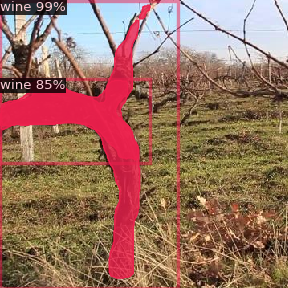

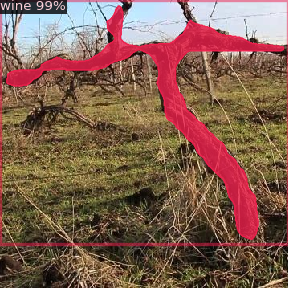

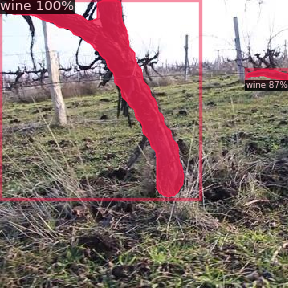

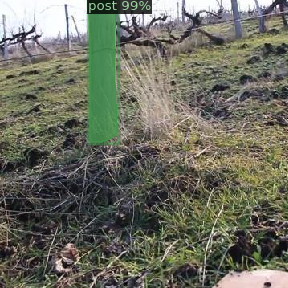

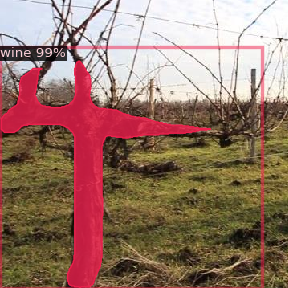

...

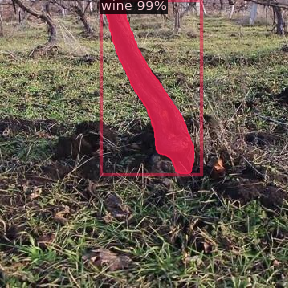

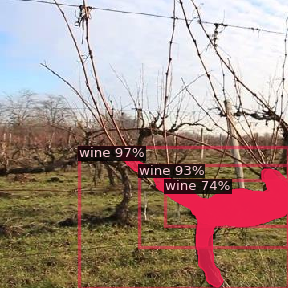

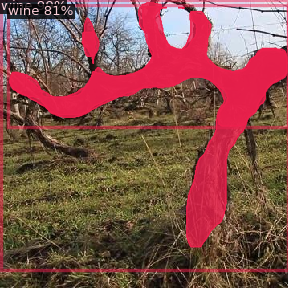

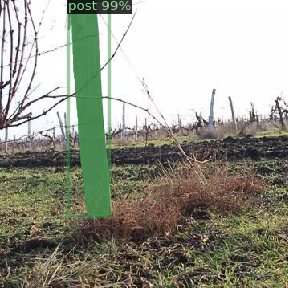

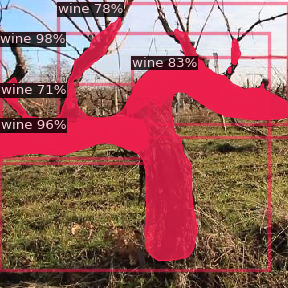

In [17]:
metadata.thing_colors = [(0, 0, 0), (68, 148, 74), (238, 32, 77)]
dataset_valid = DatasetCatalog.get(TEST_DATA_SET_NAME) # VALID_DATA_SET_NAME

for d in dataset_valid:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    visualizer = MyVisualizer(
        img[:, :, ::-1],
        metadata=metadata,
        scale=0.8,
        instance_mode=ColorMode.SEGMENTATION
    )
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [03/10 14:58:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/10 14:58:42 d2.data.datasets.coco]: Loaded 23 images in COCO format from /content/my_dataset-2/test/_annotations.coco.json


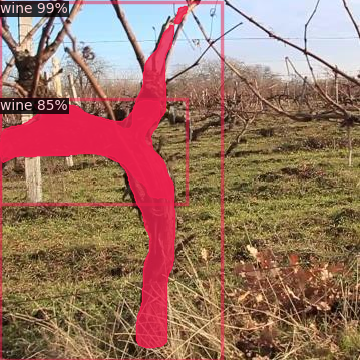

360

In [18]:
dataset_valid = DatasetCatalog.get(TEST_DATA_SET_NAME) # VALID_DATA_SET_NAME
d = dataset_valid[0]
img = cv2.imread(d["file_name"])
outputs = predictor(img)
visualizer = MyVisualizer(
    img[:, :, ::-1],
    metadata=metadata,
    scale=1,
    instance_mode=ColorMode.SEGMENTATION
)
out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])
np_arr = out.get_image()[:, :, ::-1]
len(np_arr) # [360, 360, 3]

# Работа с видео

## Изменим формат видео

In [ ]:
codec, file_ext = ("mp4v", ".mp4")

In [ ]:
# Открыть видеофайл для чтения
input_video_path = '/content/drive/MyDrive/Виноградники/MVI_8609.MOV'
video_capture = cv2.VideoCapture(input_video_path)

# Создать объект для записи видео в формате MP4
output_video_path = '/content/drive/MyDrive/Виноградники/MVI_8609.mp4'
frame_width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video_capture.get(cv2.CAP_PROP_FPS))
fourcc = cv2.VideoWriter_fourcc(*codec)
output_video = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

# Читать кадры из входного видео, изменять их формат и записывать в выходное видео
while video_capture.isOpened():
    ret, frame = video_capture.read()
    if not ret:
        break
    output_video.write(frame)

# Освободить ресурсы
video_capture.release()
output_video.release()

print("Видео успешно сконвертировано из MOV в MP4!")

Видео успешно сконвертировано из MOV в MP4!


## Загрузим видео для анализа

In [19]:
codec, file_ext = ("mp4v", ".mp4")
start_input_path = '/content/drive/MyDrive/Виноградники/MVI_8609.mp4'
video_input_path = '/content/drive/MyDrive/Виноградники/MVI_8609_crop.mp4'
video_output_path = '/content/drive/MyDrive/Виноградники/MVI_8609_output.mp4' #output_fname = args.output

video_input = cv2.VideoCapture(start_input_path)
width = int(video_input.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video_input.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(video_input.get(cv2.CAP_PROP_FPS))
fourcc = cv2.VideoWriter_fourcc(*codec)

num_frames = int(video_input.get(cv2.CAP_PROP_FRAME_COUNT))
basename = os.path.basename(video_input_path)

width, height, fps, num_frames, basename, metadata

(1280,
 720,
 50,
 27666,
 'MVI_8609_crop.mp4',
 namespace(name='my_dataset-train',
           json_file='/content/my_dataset-2/train/_annotations.coco.json',
           image_root='/content/my_dataset-2/train',
           evaluator_type='coco',
           thing_classes=['country-road', 'post', 'wine'],
           thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2},
           thing_colors=[(0, 0, 0), (68, 148, 74), (238, 32, 77)]))

## Обрежем видео до 10 секунд

In [ ]:
start_input_path = '/content/drive/MyDrive/Виноградники/MVI_8609.mp4'
video_start_input = cv2.VideoCapture(start_input_path)

# Установить начальное и конечное время обрезки (в секундах)
start_time = 10
end_time = 20

# Установить позицию видео на стартовое время
video_start_input.set(cv2.CAP_PROP_POS_MSEC, start_time * 1000)

# Создать объект для записи видео
video_input = cv2.VideoWriter(video_input_path, fourcc, fps, (width, height))

# Обработать видео кадр за кадром до достижения конечного времени
while True:
    ret, frame = video_start_input.read()
    if not ret:
        break

    current_time = video_start_input.get(cv2.CAP_PROP_POS_MSEC) / 1000

    # Проверить, достигнуто ли конечное время
    if current_time >= end_time:
        break

    # Записать обработанный кадр в выходной файл
    video_input.write(frame)

# Освободить ресурсы
video_start_input.release()
video_input.release()

In [20]:
video_input = cv2.VideoCapture(video_input_path)
video_output = cv2.VideoWriter(video_output_path, fourcc, fps, (width, height))

num_frames = int(video_input.get(cv2.CAP_PROP_FRAME_COUNT))

In [21]:
num_frames

500

In [ ]:
while True:
    ret, frame = video_input.read()
    if not ret:
        break
    #outputs = predictor(frame)
    #visualizer = Visualizer(frame[:, :, ::-1], metadata=metadata, scale=0.8, instance_mode=ColorMode.SEGMENTATION)
    #out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    #frame_to_write = out.get_image()[:, :, ::-1]
    #print(torch.from_numpy(frame_to_write).shape)
    video_output.write(frame)
    print(len(frame), len(frame[0]), len(frame[0][0]))
    #cv2.imshow("Video Output", frame)
    #if cv2.waitKey(1) == 27:
       #break  # esc to quit


video_input.release()
video_output.release()

In [22]:
k = 1
while True:
    ret, frame = video_input.read()
    if not ret:
        break
    outputs = predictor(frame)
    visualizer = Visualizer(frame[:, :, ::-1], metadata=metadata, scale=1, instance_mode=ColorMode.SEGMENTATION)
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    frame_to_write = out.get_image()[:, :, ::-1]
    #print(torch.from_numpy(frame_to_write).shape)
    video_output.write(frame_to_write)
    print(k, frame_to_write.dtype, len(frame_to_write), len(frame_to_write[0]), len(frame_to_write[0][0]))
    k += 1

    # cv2.imshow("Video Output", frame_to_write)
    #if cv2.waitKey(1) == 27:
    #    break  # esc to quit


video_input.release()
video_output.release()


1 uint8 720 1280 3
2 uint8 720 1280 3
3 uint8 720 1280 3
4 uint8 720 1280 3
5 uint8 720 1280 3
6 uint8 720 1280 3
7 uint8 720 1280 3
8 uint8 720 1280 3
9 uint8 720 1280 3
10 uint8 720 1280 3
11 uint8 720 1280 3
12 uint8 720 1280 3
13 uint8 720 1280 3
14 uint8 720 1280 3
15 uint8 720 1280 3
16 uint8 720 1280 3
17 uint8 720 1280 3
18 uint8 720 1280 3
19 uint8 720 1280 3
20 uint8 720 1280 3
21 uint8 720 1280 3
22 uint8 720 1280 3
23 uint8 720 1280 3
24 uint8 720 1280 3
25 uint8 720 1280 3
26 uint8 720 1280 3
27 uint8 720 1280 3
28 uint8 720 1280 3
29 uint8 720 1280 3
30 uint8 720 1280 3
31 uint8 720 1280 3
32 uint8 720 1280 3
33 uint8 720 1280 3
34 uint8 720 1280 3
35 uint8 720 1280 3
36 uint8 720 1280 3
37 uint8 720 1280 3
38 uint8 720 1280 3
39 uint8 720 1280 3
40 uint8 720 1280 3
41 uint8 720 1280 3
42 uint8 720 1280 3
43 uint8 720 1280 3
44 uint8 720 1280 3
45 uint8 720 1280 3
46 uint8 720 1280 3
47 uint8 720 1280 3
48 uint8 720 1280 3
49 uint8 720 1280 3
50 uint8 720 1280 3
51 uint8 